In [1]:
from __future__ import division, print_function
import os, glob, matplotlib.pyplot as plt, numpy as np, pandas as pd, math
%load_ext autoreload
%autoreload 2
np.set_printoptions(precision=6, suppress=True)
%matplotlib inline

Gathering data for juliette at  lvl1
Gathering data for remi at  lvl1
Gathering data for valerie at  lvl1
Gathering data for elisa at  lvl1
Gathering data for maxime at  lvl1
Gathering data for jade at  lvl1
Gathering data for thys at  lvl1
Gathering data for bruno at  lvl1
Duration per level (in seconds) = [427.989, 210.93, 135.326, 191.879, 303.023, 131.361, 257.259, 146.65]
Total duration = 30.07 min


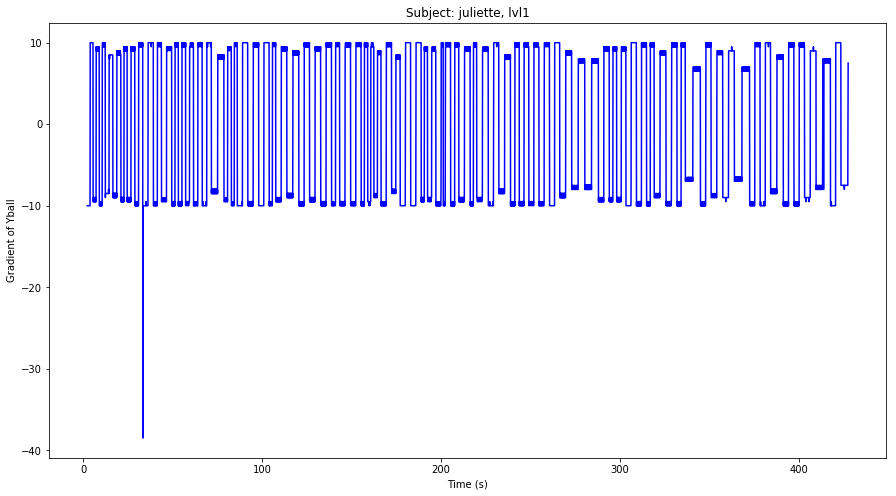

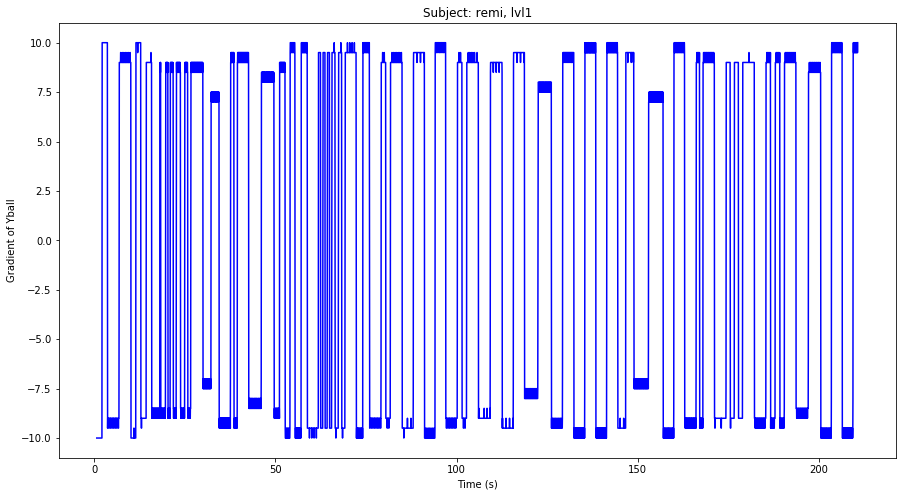

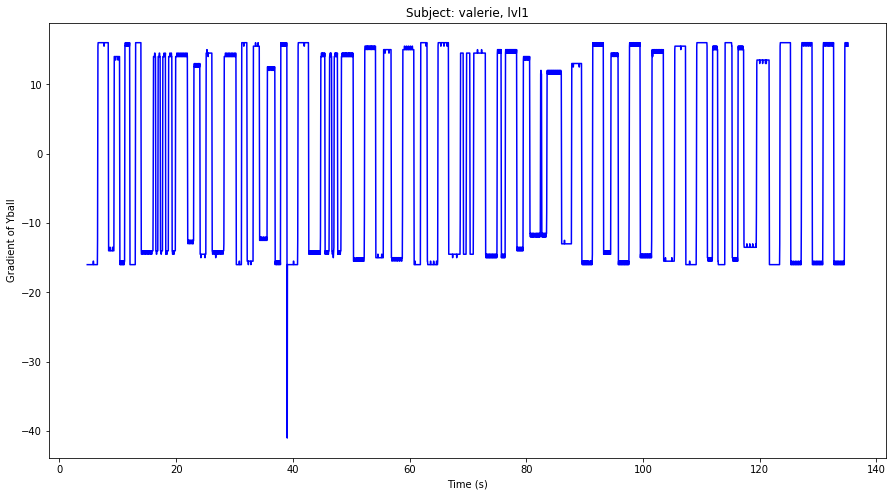

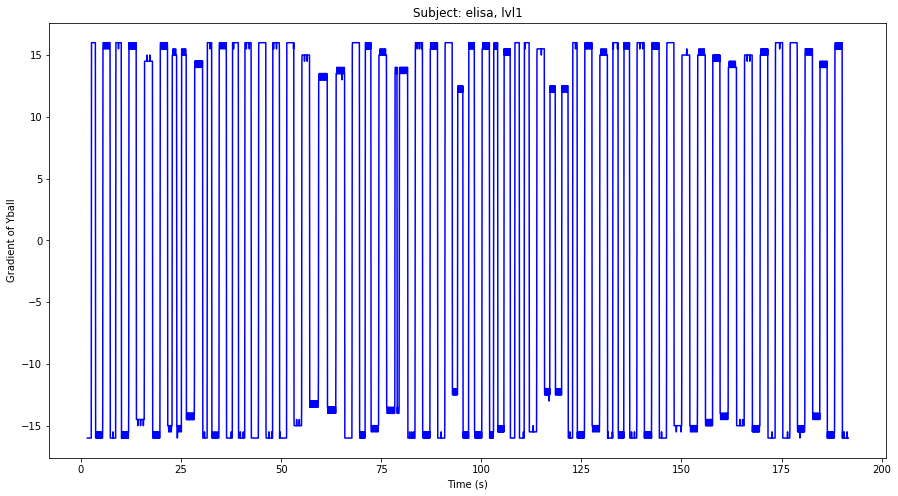

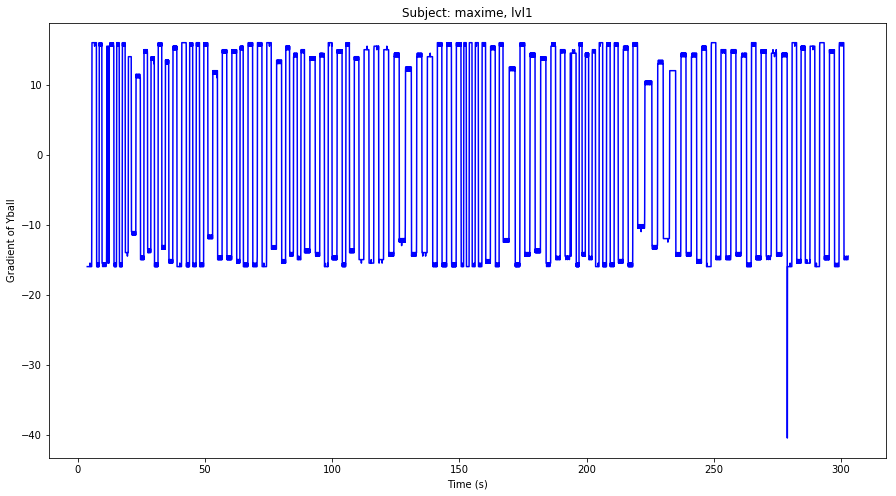

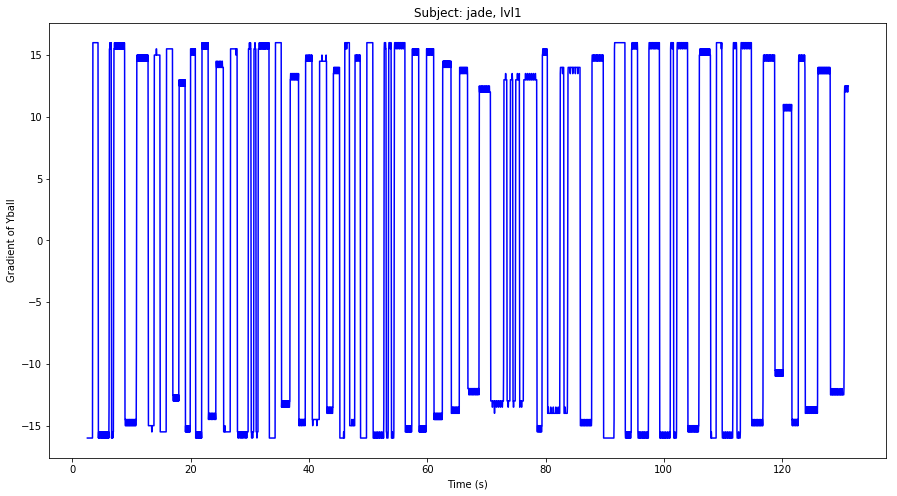

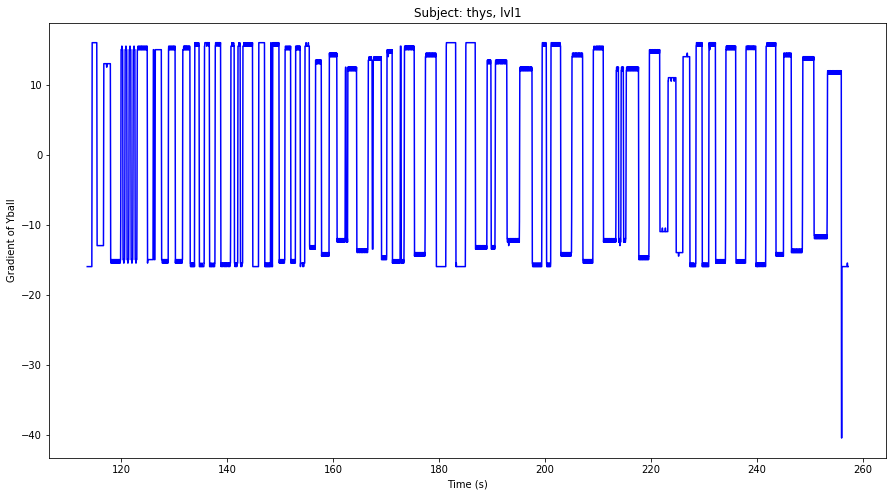

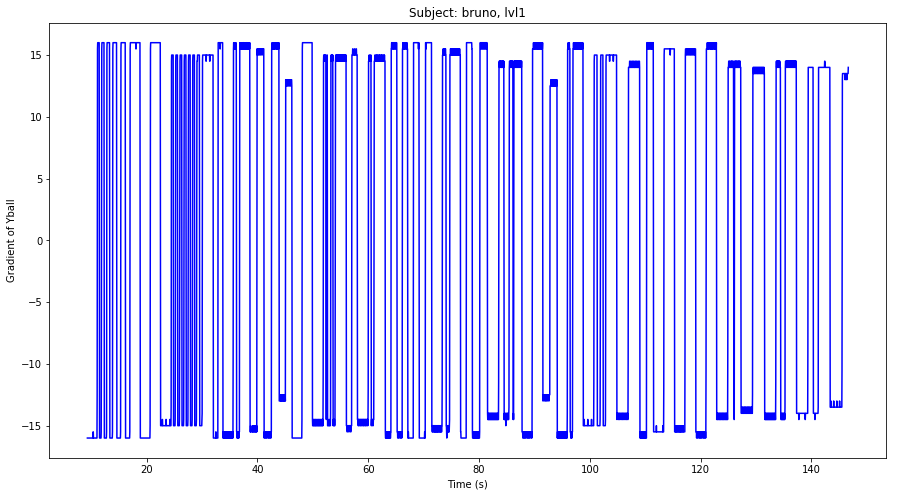

In [2]:
df, grad = {}, {}
duration, subjects, levels = [], [], []

for file in glob.glob(os.path.join('..', 'datadir', 'pilot', '*lvl1*csv')):
    df_ = pd.read_csv(file, '\t')

    fig, ax = plt.subplots(figsize=(15,8))

    _, fname = os.path.split(file)
    fname, ext = fname.split('.')
    date, time, _, level, subj = fname.split('_')
    print('Gathering data for', subj, 'at ', level)

    if subj not in subjects:
        subjects.append(subj)
    if level not in levels:
        levels.append(level)

    try:
        df[subj][level] = {}
        grad[subj] = {}
    except:
        df[subj] = {}
        df[subj][level] = {}
        grad[subj] = {}
        grad[subj][level] = {}

    for axis in ['T', 'X', 'Y']:
        for obj in ['gaze', 'ball', 'paddle']:
            df[subj][level][axis+obj] = df_[axis+obj]

    duration.append(float(str(round(df[subj][level]['Tgaze'][len(df[subj][level]['Tgaze'])-1] - df[subj][level]['Tgaze'][0],3)))) # retrieve the lengths of the levels

    """ Gradients """
    N_start, N_stop = 0, int((df[subj][level]['Tgaze'][len(df[subj][level]['Tgaze'])-1] - df[subj][level]['Tgaze'][0])*30)
    """ax.plot(df[subj][level]['Tgaze'][N_start:N_stop]-df[subj][level]['Tgaze'][0], np.gradient(df[subj][level]['Ygaze'])[N_start:N_stop], 'g')"""
    ax.plot(df[subj][level]['Tgaze'][N_start:N_stop]-df[subj][level]['Tgaze'][0], np.gradient(df[subj][level]['Yball'])[N_start:N_stop], 'b')

    # find the moment when the ball collide with an element from below
    k = 0
    grad_ = []
    for value in np.gradient(df[subj][level]['Yball'])[N_start:N_stop]:
        k += 1
        if value == 0:
            if np.gradient(df[subj][level]['Yball'])[k-2] < 0:
                grad_.append(k)
    grad[subj][level] = grad_

    ax.set_title('Subject: %s, %s' %(subj, level))
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Gradient of Yball')
print("Duration per level (in seconds) = " + str(duration))
print("Total duration = " + str(round(sum(duration)/60, 2)) + " min")

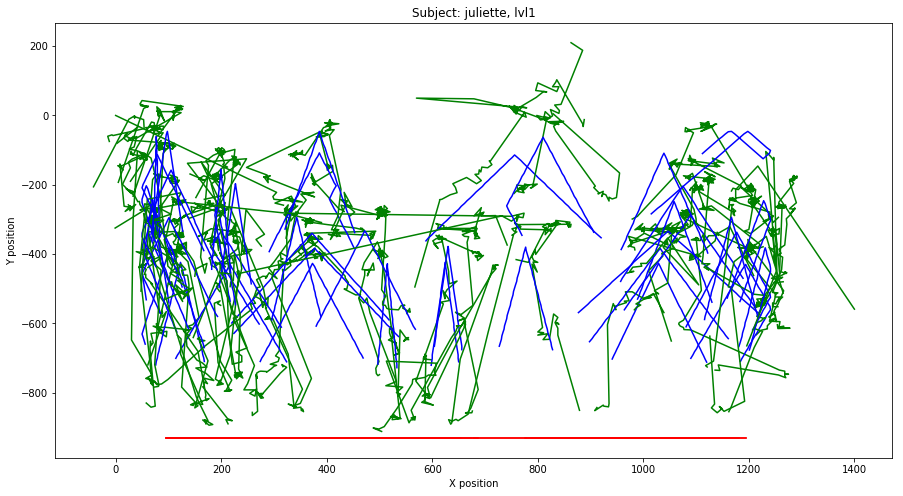

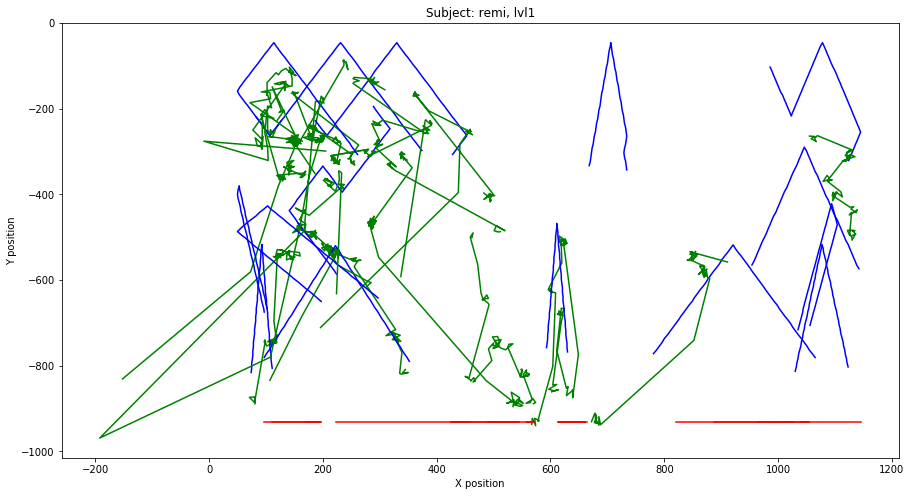

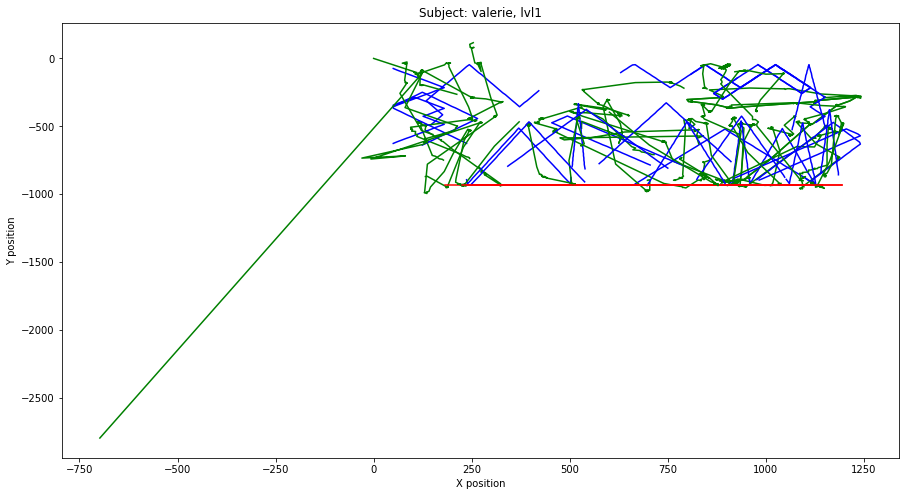

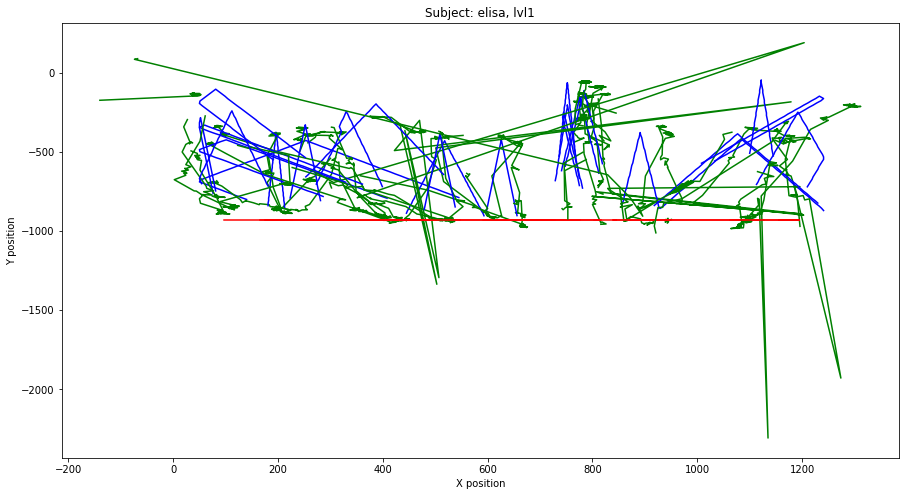

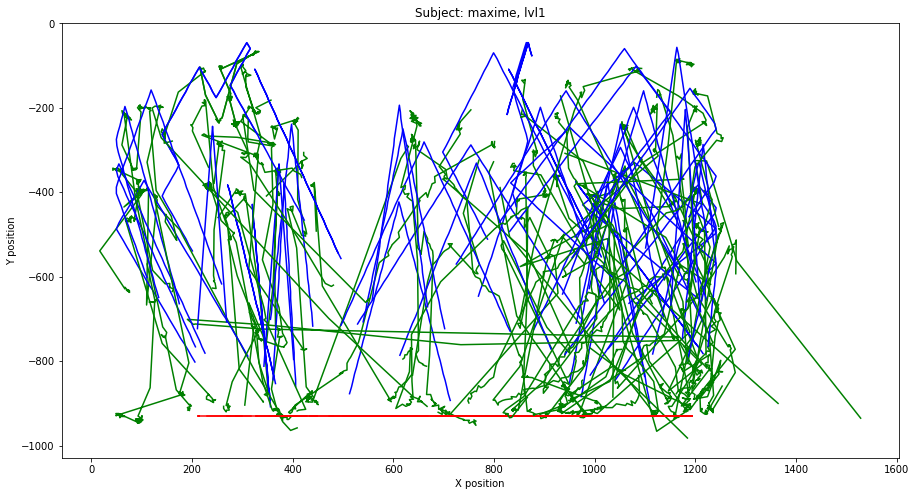

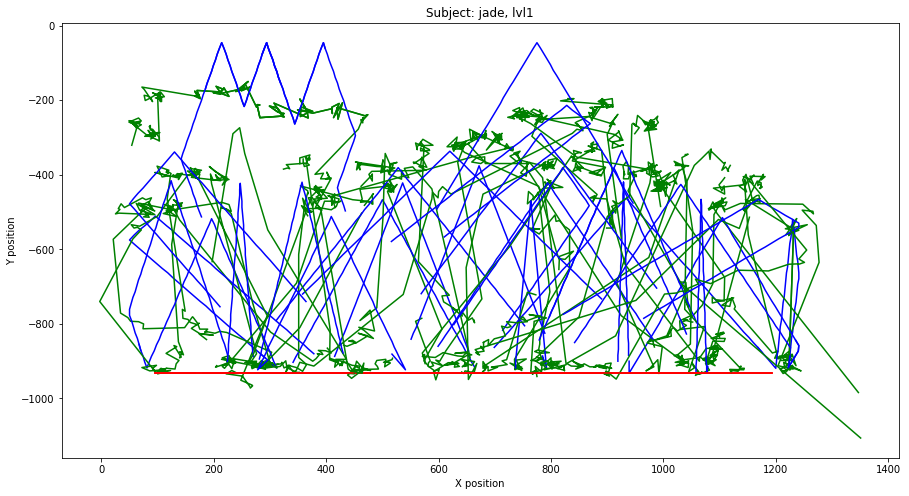

In [3]:
deltav = 30

for subj in subjects:
    for level in levels:
        fig, ax = plt.subplots(figsize=(15,8))
        for v in grad[subj][level]:
            ax.plot(df[subj][level]['Xgaze'][v-deltav:v+deltav], -np.array(df[subj][level]['Ygaze'][v-deltav:v+deltav]), 'g')
            ax.plot(df[subj][level]['Xball'][v-deltav:v+deltav], -np.array(df[subj][level]['Yball'][v-deltav:v+deltav]), 'b')
            ax.plot(df[subj][level]['Xpaddle'][v-deltav:v+deltav], -np.array(df[subj][level]['Ypaddle'][v-deltav:v+deltav]), 'r')
            
            ax.set_title('Subject: %s, %s' %(subj, level))
            ax.set_xlabel('X position')
            ax.set_ylabel('Y position')

juliette
lvl1
remi
lvl1
valerie
lvl1
elisa
lvl1
maxime
lvl1
jade
lvl1


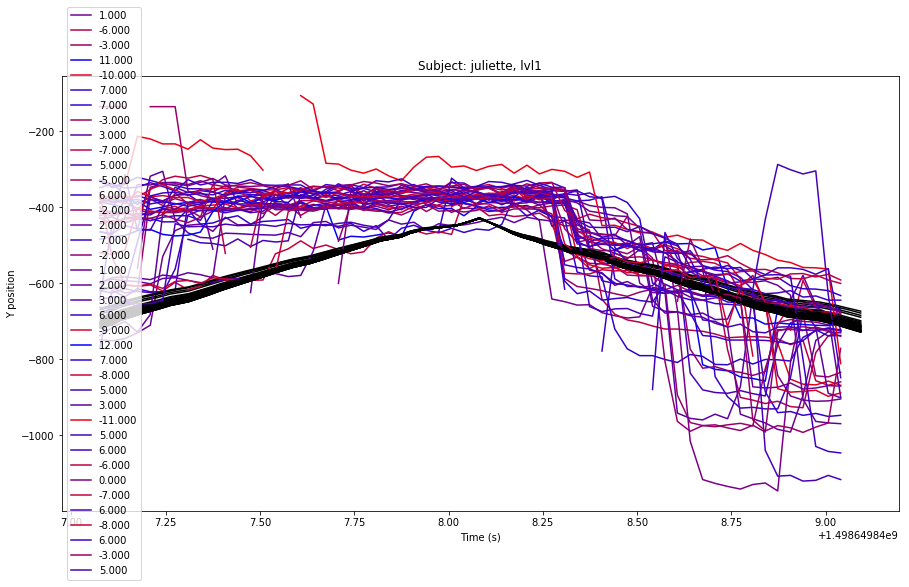

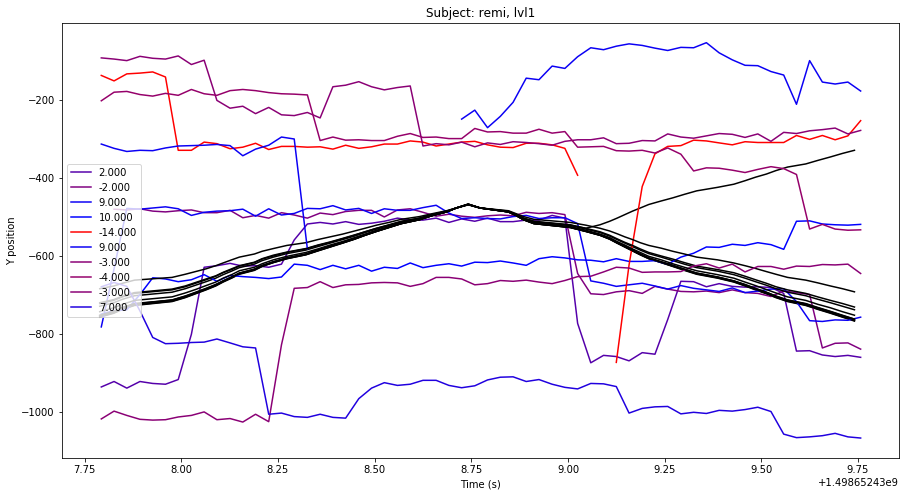

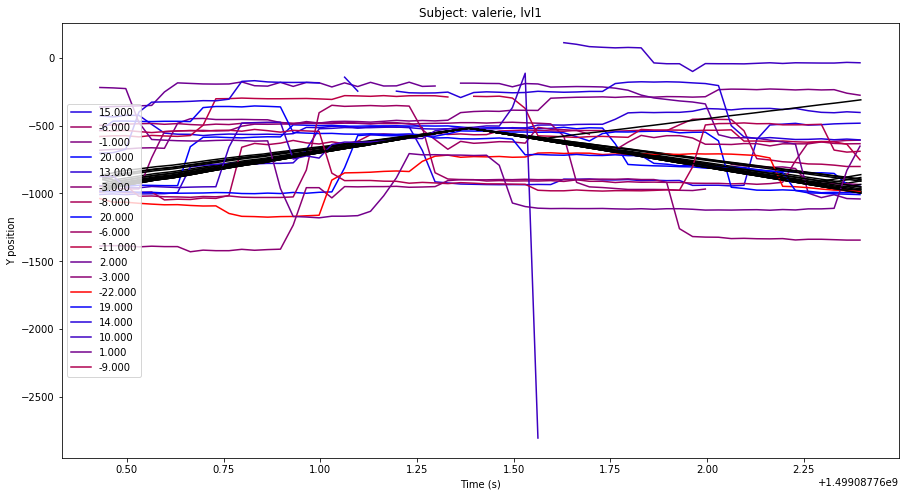

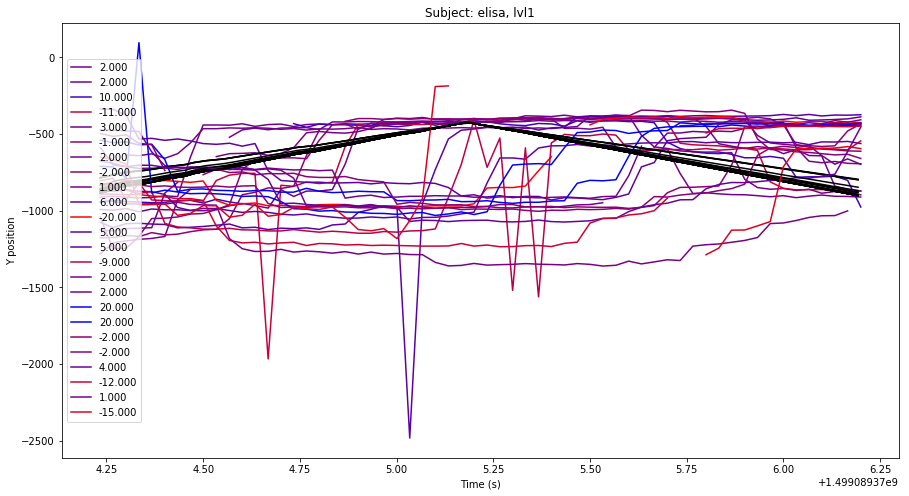

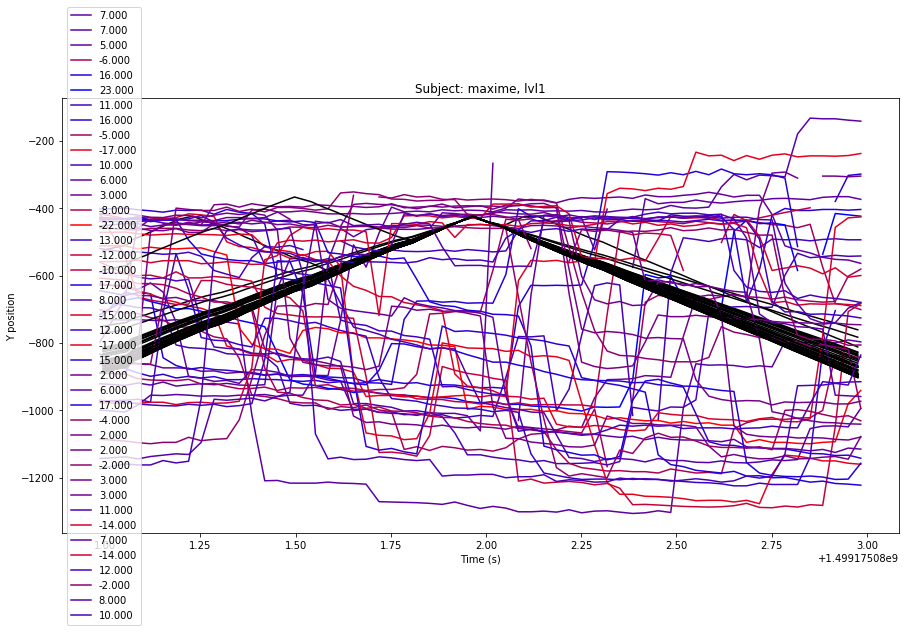

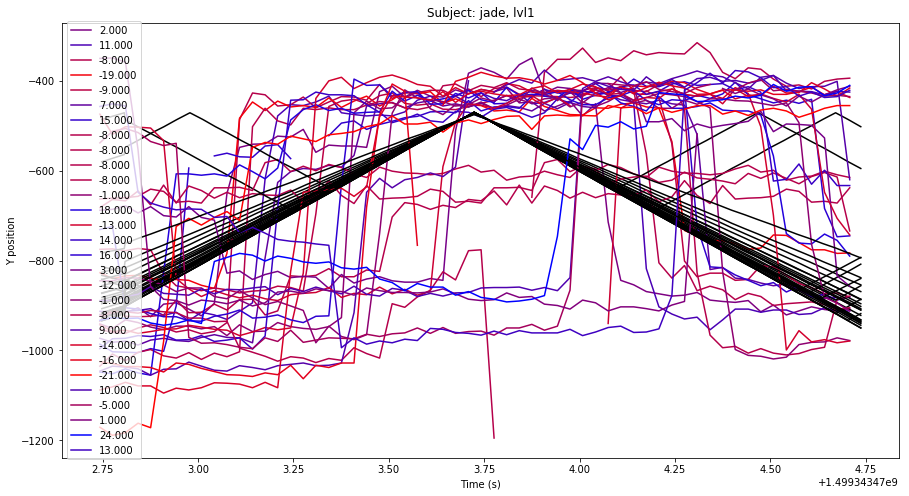

In [4]:
for subj in subjects:
    print(subj)
    for level in levels:
        print(level)
        grad_h_abs = []
        for v in grad[subj][level]:
            grad_h_abs.append(df[subj][level]['Xball'][v+1] - df[subj][level]['Xball'][v-1])

        grad_h = np.array(grad_h_abs)
        grad_h -= grad_h.min() # valeur min fixée à 0
        grad_h /= grad_h.max() # normalisation entre 0 et 1

        fig, ax = plt.subplots(figsize=(15,8))
        for v, g_h, g_h_abs in zip(grad[subj][level], grad_h, grad_h_abs):
            if df[subj][level]['Yball'][v] > 60:
                c = [1-g_h, 0, g_h]
                diff = df[subj][level]['Yball'][grad[subj][level][0]] - df[subj][level]['Yball'][v]
                ax.plot(df[subj][level]['Tgaze'][0:2*deltav], -np.array(df[subj][level]['Ygaze'][v-deltav:v+deltav]) - diff, c=c, label='%0.3f' % g_h_abs)
                ax.plot(df[subj][level]['Tpaddle'][0:2*deltav], -np.array(df[subj][level]['Yball'][v-deltav:v+deltav]) - diff, 'k')

                ax.set_title('Subject: %s, %s' %(subj, level))
                ax.set_ylabel('Y position')
                ax.set_xlabel('Time (s)')
                ax.legend(loc='center left')

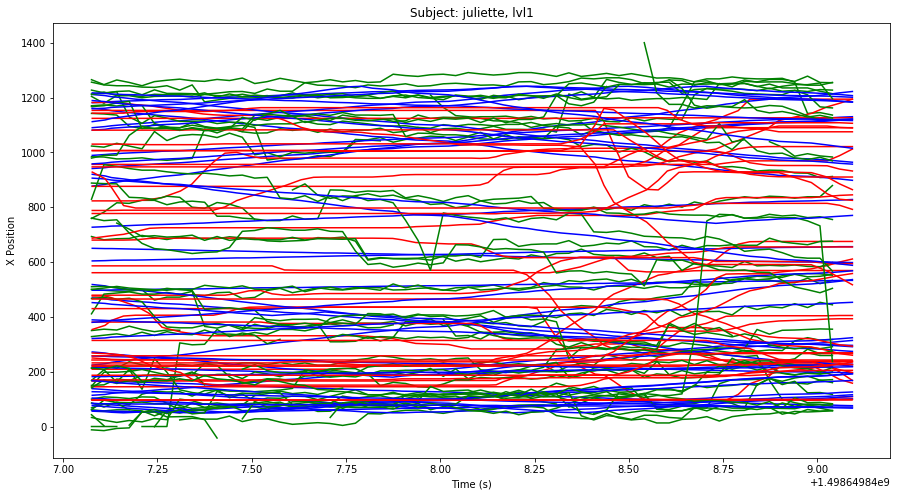

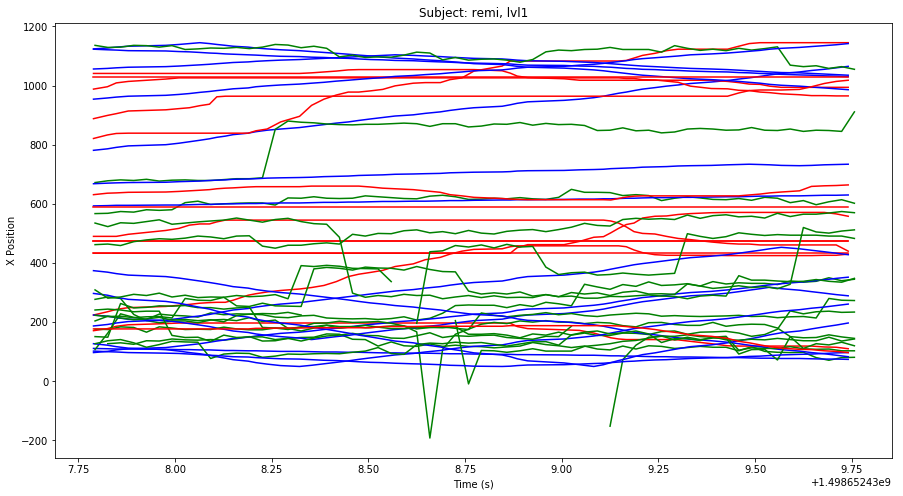

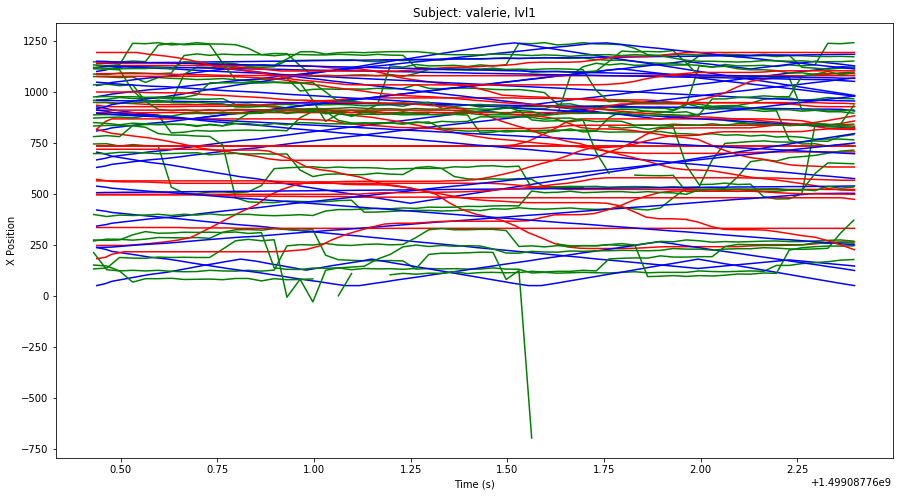

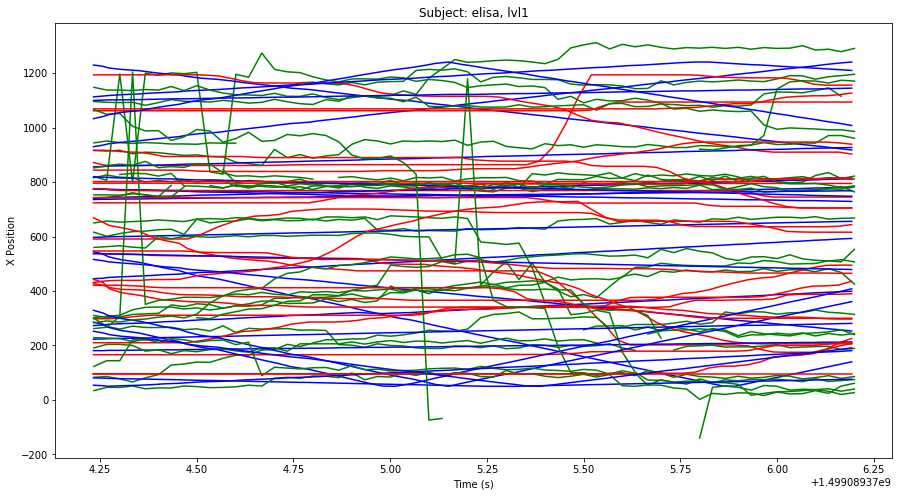

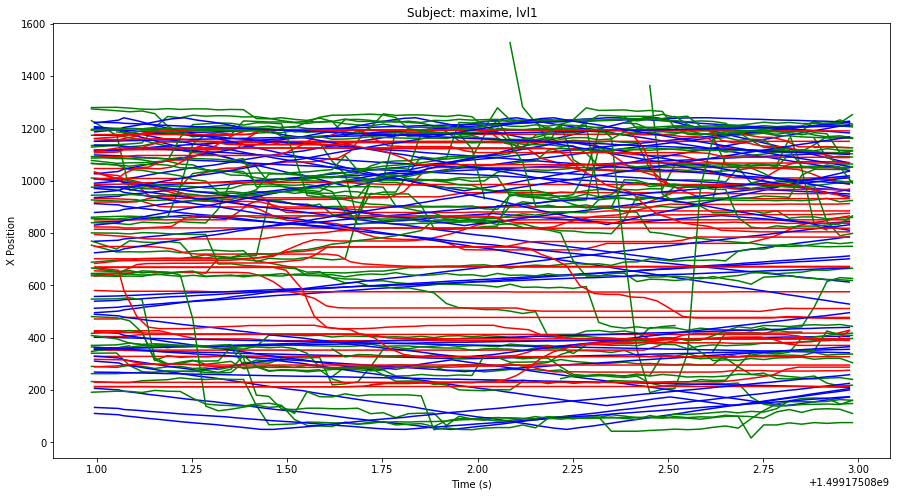

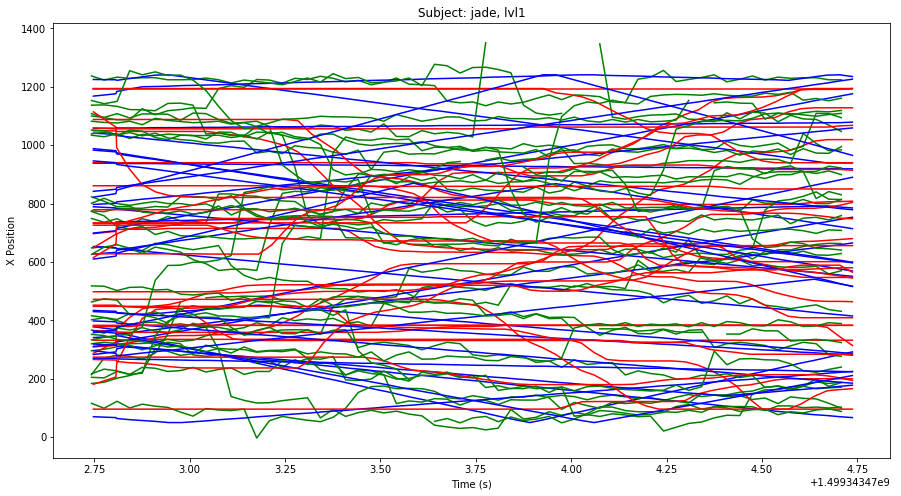

In [5]:
for subj in subjects:
    for level in levels:
        fig, ax = plt.subplots(figsize=(15,8))
        for v in grad[subj][level]:
            ax.plot(df[subj][level]['Tgaze'][0:2*deltav], df[subj][level]['Xgaze'][v-deltav:v+deltav], 'g')
            ax.plot(df[subj][level]['Tpaddle'][0:2*deltav], df[subj][level]['Xball'][v-deltav:v+deltav], 'b')
            ax.plot(df[subj][level]['Tpaddle'][0:2*deltav], df[subj][level]['Xpaddle'][v-deltav:v+deltav], 'r')

            ax.set_title('Subject: %s, %s' %(subj, level))
            ax.set_ylabel('X Position')
            ax.set_xlabel('Time (s)')

Subject:  juliette
lvl1


C:\Users\Syht\Documents\Stage_LNC\Python\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Subject:  remi
lvl1
Subject:  valerie
lvl1
Subject:  elisa
lvl1
Subject:  maxime
lvl1
Subject:  jade
lvl1


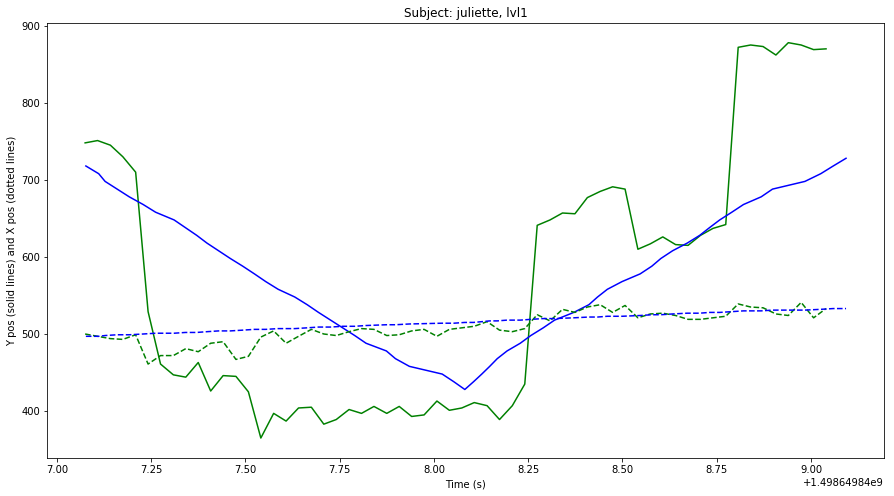

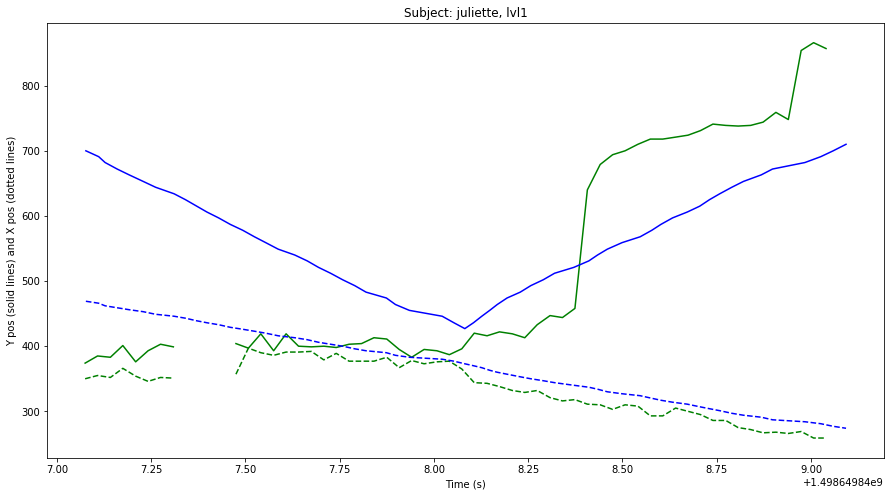

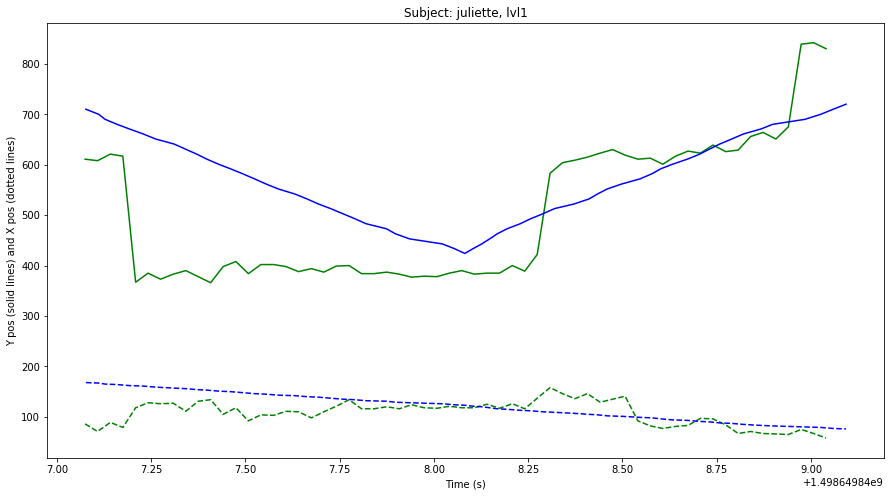

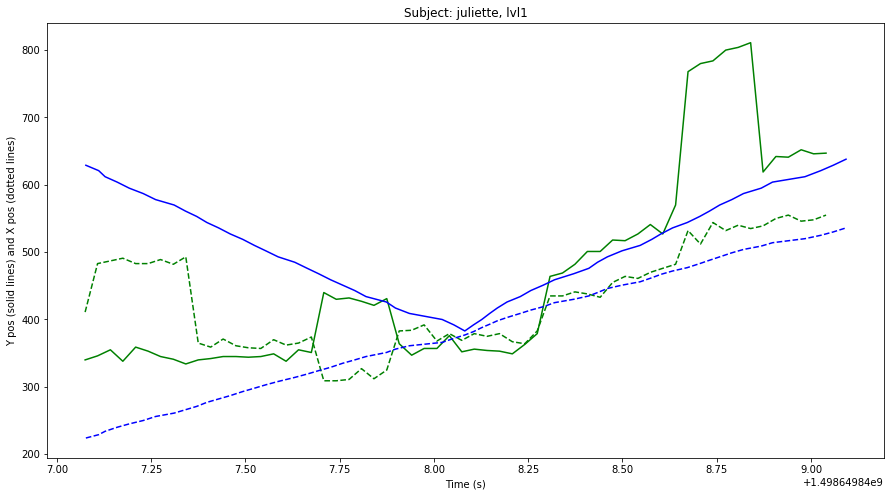

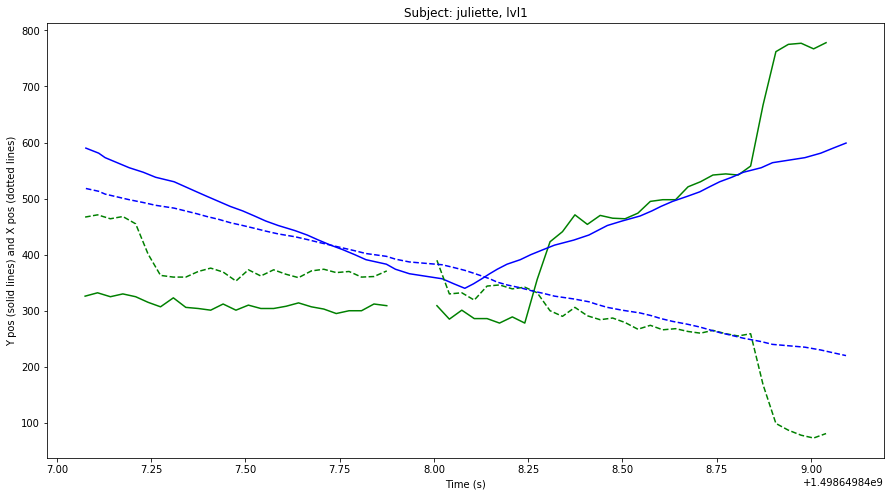

...

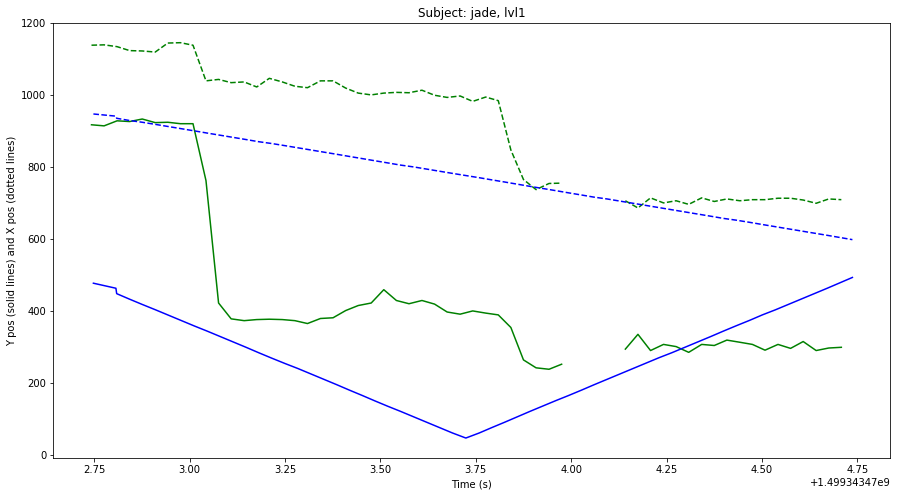

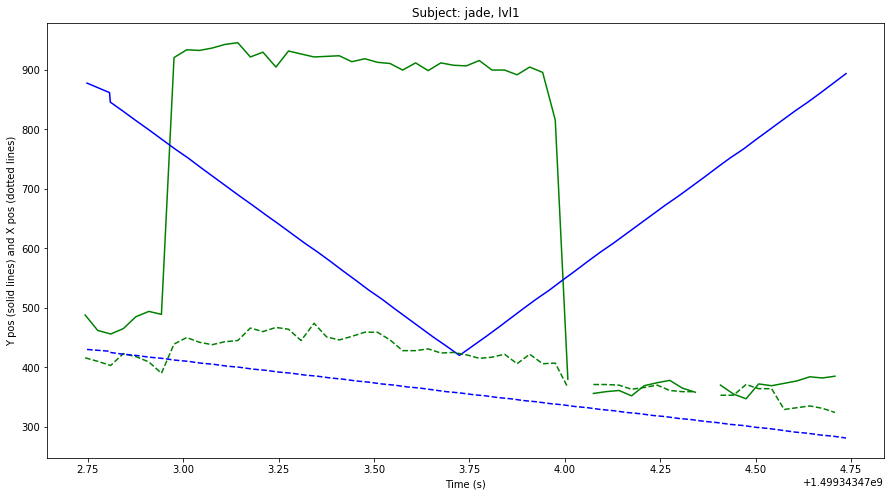

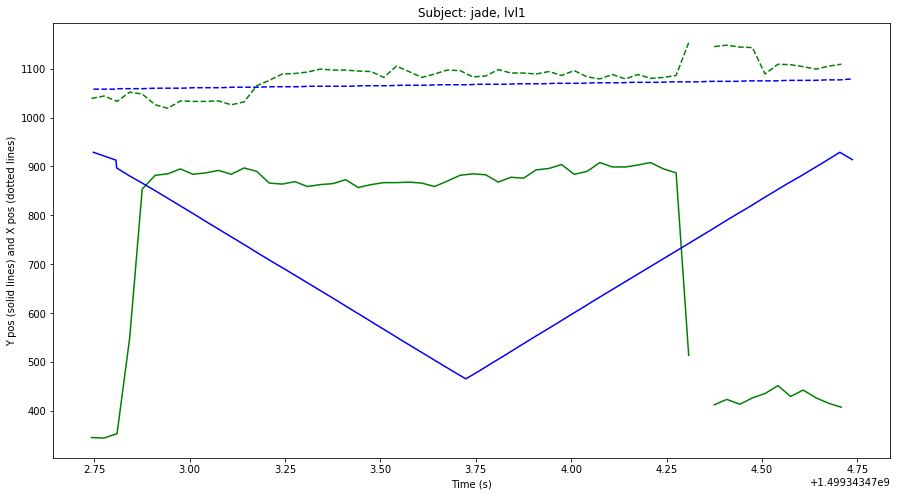

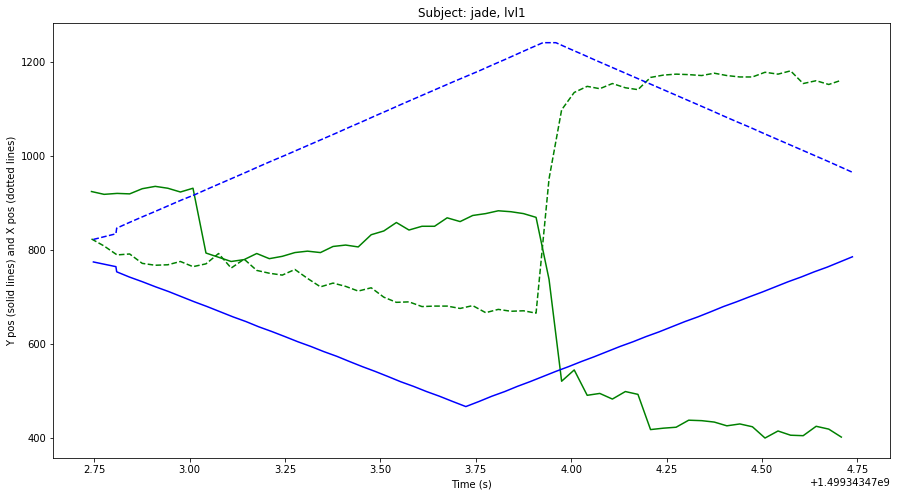

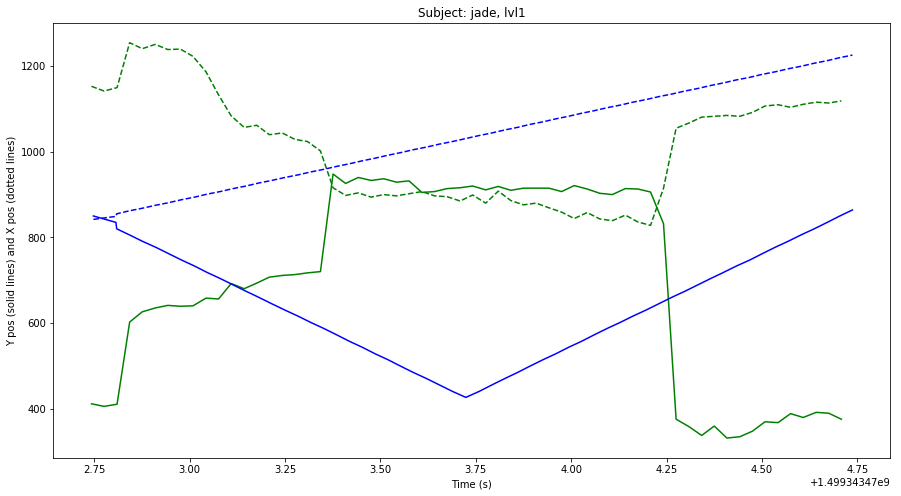

In [6]:
for subj in subjects:
    print("Subject: ", subj)
    for level in levels:
        print(level)
        for v in grad[subj][level]:
            fig, ax = plt.subplots(figsize=(15,8))
            ax.plot(df[subj][level]['Tgaze'][0:2*deltav], df[subj][level]['Ygaze'][v-deltav:v+deltav], 'g')
            ax.plot(df[subj][level]['Tpaddle'][0:2*deltav], df[subj][level]['Yball'][v-deltav:v+deltav], 'b')
            ax.plot(df[subj][level]['Tgaze'][0:2*deltav], df[subj][level]['Xgaze'][v-deltav:v+deltav], 'g--')
            ax.plot(df[subj][level]['Tpaddle'][0:2*deltav], df[subj][level]['Xball'][v-deltav:v+deltav], 'b--')

            ax.set_title('Subject: %s, %s' %(subj, level))
            ax.set_ylabel('Y pos (solid lines) and X pos (dotted lines)')
            ax.set_xlabel('Time (s)')

In [3]:
for subj in subjects:
    if subj == remi:
    print("Subject: ", subj)
    for level in levels:
        print(level)
        for v in grad[subj][level]:
            fig, ax = plt.subplots(figsize=(15,8))
            #ax.plot(df[subj][level]['Tgaze'][0:2*deltav]-df[subj][level]['Tgaze'][deltav], np.sqrt((df[subj][level]['Ygaze'][v-deltav:v+deltav]- df[subj][level]['Yball'][v-deltav:v+deltav])**2 + (df[subj][level]['Xgaze'][v-deltav:v+deltav]-df[subj][level]['Xball'][v-deltav:v+deltav])**2), 'g')
            ax.plot(df[subj][level]['Tgaze'][0:2*deltav]-df[subj][level]['Tgaze'][deltav], np.sqrt((df[subj][level]['Ygaze'][v-deltav:v+deltav]- df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v-deltav:v+deltav]-df[subj][level]['Xball'][v])**2), 'r')
            ax.plot([0, 0], [0, 800], 'k--')

            #ax.set_title('Subject: %s, %s' %(subj, level))
            ax.set_ylabel('Distance rebound/gaze (pixel)')
            ax.set_xlabel('Time (s)')
            ax.set_ylim(0, 800)

NameError: name 'remi' is not defined

In [28]:
t_sacc = []
deltav = 10000
for subj in subjects:
    print("Subject: ", subj)
    for level in levels:
        print(level)
        for v in grad[subj][level]:
            if np.sqrt((df[subj][level]['Ygaze'][v]- df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v]-df[subj][level]['Xball'][v])**2) < 200:
                i = v-1
                for x in np.sqrt((df[subj][level]['Ygaze'][v:v+deltav]- df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v:v+deltav]-df[subj][level]['Xball'][v])**2):
                    i += 1
                    if x > 200:
                        t_sacc.append(df[subj][level]['Tgaze'][i]-df[subj][level]['Tgaze'][v])
                        break

t_mean = np.mean(t_sacc)
print(t_mean)

Subject:  juliette
lvl1
Subject:  remi
lvl1
Subject:  valerie
lvl1
Subject:  elisa
lvl1
Subject:  maxime
lvl1
Subject:  jade
lvl1
0.687260426581
